In [1]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Image, display_html, display, Math, HTML

# Conjugate Priors

```{margin}
These sections continue to draw extensively on [Think Bayes](https://greenteapress.com/wp/think-bayes) by Allen B. Downey.
```

Today we'll introduce a simple but powerful method for performing Bayesian analysis.  

It's useful in certain commonly occurring situations involving a single parameter: the use of a __conjugate prior.__

To motivate the use of conjugate priors, let's take a look at how we've been performing Bayesian updates so far.

In all the cases we've studied, we have formed a __table__ that captures the distribution of interest.   It could be a 1D table for a distribution over a single parameter, or a 2D table for a distribution over two parameters, etc.

That is, we are breaking the distribution up into little pieces and separately computing each little piece.  A Bayesian update consists of multiplying the prior by the likelihood separately in each piece of the distribution.

This called a __grid__ approach to working with distributions.

<center>
    
<img src="images/Grid-Bayesian-Update.jpg" width="650px">
    
</center>

Now, there is nothing wrong with the grid approach, but in some cases we can proceed more quickly to an answer by working with distributions as formulas -- that is, entirely mathematically.

## Doing a Bayesian Update Analytically

Let's say we want to do a Bayesian update, but using distributions as formulas (rather than grids).

Assume the formula for our prior is some function:

$$ f(\theta) $$


and the formula for our likelihood (based on seeing data $x$) is some other function:

$$ g_x(\theta) $$


then the (unnormalized) posterior is 

$$ f(\theta) g_x(\theta)$$


Now, in general, this may not get us anywhere useful. If we cannot simplify $f(\theta) g_x(\theta),$ then to evaluate the posterior, we would just wind up doing the multiplications numerically -- ie, via the grid method.

But in some cases, that is __for certain combinations of prior and likelihood__ functions $f$ and $g$, the product __does__ simplify, and as a result we can make progress without needing to do a grid computation.

Remember that the likelihood $g_x(\theta)$ has the same formula as its associated probability distribution $p_\theta(x)$.   

It's just that to get the likelihood, we use the formula differently: we hold $x$ fixed (the data) and vary $\theta$ (the parameter of the distribution). 

So when we have a particular distribution $p_\theta(x)$ that has likelihood $g_x(\theta)$, if there is a prior distribution $f(\theta)$ such that the product of $f$ and $g$ simplifies, we call $f(\theta)$ a __conjugate__ prior for the distribution $p_\theta(x)$.

("Conjugate" means connected, or coupled.)

## The Binomial and The Beta

OK, this will all become clearer with an example.   

Let's think back to the [Euro Problem](./19-Estimating-Proportions.html#the-euro-problem-or-return-to-coin-flipping).  The goal there was to estimate the parameter $p$ of the Belgian Euro landing heads.

We saw that if we have a dataset of $n$ coin flips showing $k$ heads, that the distribution of interest is the Binomial, ie 

$$\operatorname{Bin}_{n,p}(k) = \binom{n}{k}\; p^k\; (1-p)^{n-k}.$$

So, for this problem, $p$ is the parameter of interest $\theta$, and $k$ is the data $x$.   We will consider $n$ fixed.  Let's rewrite the formula using those notations:

$$\operatorname{Bin}_\theta(x) = \binom{n}{x}\; \theta^x\; (1-\theta)^{n-x}.$$

What is the likelihood of a particular dataset $x$?  Well it is the same formula, just varying $\theta$ intead of $x$:

$$\operatorname{Likelihood}_x(\theta) = \binom{n}{x}\; \theta^x\; (1-\theta)^{n-x}.$$

Now, the Binomial distribution has a conjugate prior.  It is called the __Beta__ distribution and it has two parameters $\alpha$ and $\beta$.

It is defined as:

$$\operatorname{Beta}_{\alpha,\beta}(\theta) = \frac{\Gamma(\alpha+\beta)}{\Gamma(\alpha)\Gamma(\beta)} \theta^{\alpha-1}(1-\theta)^{\beta-1}$$

This is a distribution for $\theta$ in $[0, 1]$.

Let's examine this formula more closely.   It has two parts:

$$\operatorname{Beta}_{\alpha,\beta}(\theta) = \underbrace{\frac{\Gamma(\alpha+\beta)}{\Gamma(\alpha)\Gamma(\beta)}}_{\text{normalizing constant}}\;\;\underbrace{\theta^{\alpha-1}(1-\theta)^{\beta-1}}_{\text{functional part}}$$

You can think of the $\Gamma$ function in the normalizing constant as similar to a factorial (but for real numbers).

For any given $\alpha$ and $\beta$, the normalizer is a constant.  Its role is just to make sure the entire distribution sums to 1.   

Since the normalizing constant doesn't vary with $\theta$, and $\theta$ is what we care about, let's set the normalizing constant aside for now.

We'll bring the normalizing constant back in at the end.

So for now we'll work with the __unnormalized Beta__: 

$$ \operatorname{Beta}_{\alpha,\beta}(\theta) \propto \theta^{\alpha-1}(1-\theta)^{\beta-1} $$

Let's say we choose a particular Beta distribution by setting some values of $\alpha$ and $\beta$.

What happens if we use this distribution as our prior?

Again, we'll set aside the normalizing constant of the Binomial, so the likelihood becomes:

$$\operatorname{Likelihood}_x(\theta) \propto \theta^x\; (1-\theta)^{n-x}.$$

Let's do a Bayesian update with this prior and likelihood:

$$\text{Posterior} = \operatorname{Prior}(\theta) \operatorname{Likelihood}_x(\theta)$$

$$\text{Posterior} = \operatorname{Beta}_{\alpha,\beta}(\theta) \operatorname{Likelihood}_x(\theta)$$

$$\text{Posterior} \propto \left[\theta^{\alpha-1}(1-\theta)^{\beta-1}\right] \cdot \left[\theta^x\; (1-\theta)^{n-x}\right]$$

Now, here is where the magic happens!

Notice that we can combine terms:
    
$$\text{Posterior} \propto \theta^{x+\alpha-1}(1-\theta)^{n-x+\beta-1}$$

But this is just another unnormalized Beta distribution!

It has new values for its parameters: $\alpha+x$ and $\beta+n-x$.

And to normalize this distribution, we just use the formula for the Beta normalizing constant using these new parameters.

### Insights 

What happened here?   

We used a particular formula for a prior, and when we did a Bayesian update, we got the same formula back for the posterior (with new values for its parameters).

No grids involved!

Now, you may ask: OK, but does the Beta distribution actually make a __good__ prior for real problems?

In fact, yes it does.   In particular, when $\alpha = \beta = 1$, the Beta is the __Uniform__ distribution on (0, 1). 

So using the Beta for problems like the [Euro Problem](19-Estimating-Proportions.html#the-euro-problem-or-return-to-coin-flipping) is particularly easy:

Start with the uniform prior:

$$\theta \sim \operatorname{Beta}_{\alpha = 1, \beta = 1}(\theta)$$

Now, recall that we observed 140 heads and 110 tails.

So the posterior is 

$$\theta \sim \operatorname{Beta}_{\alpha = 141, \beta = 111}(\theta)$$

### In Practice

Let's see how easy this is to use.  

In [2]:
import scipy.stats

prior = scipy.stats.beta(1, 1)
posterior = scipy.stats.beta(141, 111)

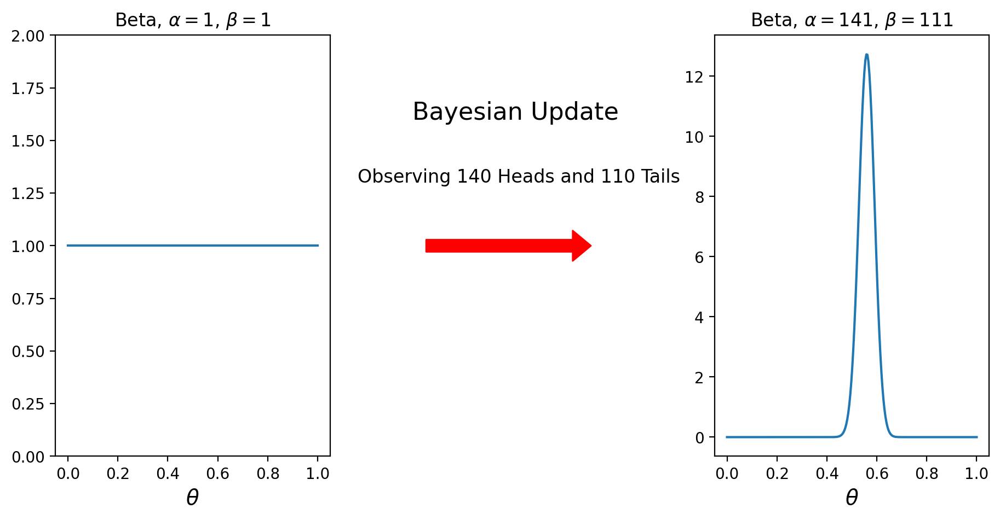

In [3]:
xvals = np.linspace(0, 1, 250)
prior_dist = prior.pdf(xvals)
posterior_dist = posterior.pdf(xvals)

fig, ax = plt.subplots(1, 3, figsize = (11, 5))
ax[0].plot(xvals, prior_dist)
ax[2].plot(xvals, posterior_dist)
ax[0].set_ylim(0,2)
ax[0].set_title(r'Beta, $\alpha = 1$, $\beta = 1$')
ax[0].set_xlabel(r'$\theta$', fontsize = 14)
ax[2].set_title(r'Beta, $\alpha = 141$, $\beta = 111$')
ax[2].set_xlabel(r'$\theta$', fontsize = 14)


ax[0].yaxis.label.set_fontsize(16)
ax[2].yaxis.label.set_fontsize(16)
# turn off y axis entirely
ax[1].yaxis.set_visible(False)
# hide x axis but not its label
# ax[1].xaxis.set_major_locator(plt.NullLocator())
# turn off x axis entirely
ax[1].xaxis.set_visible(False)
# remove the "box" around the plot
for spine in ax[1].spines.values():
    spine.set_visible(False);
ax[1].set_xlim(0,1)
ax[1].set_ylim(0,1)
ax[1].annotate('', xytext = [0.15, 0.5], xy = [0.75, 0.5], arrowprops = {'width': 8, 'headwidth': 20, 'color': 'red'})
ax[1].text(.1, 0.8, 'Bayesian Update', fontsize = 16)
ax[1].text(-0.1, 0.65, 'Observing 140 Heads and 110 Tails', fontsize = 12);

That's it -- just one function call to scipy to get our answer.

Now, previously we computed the prior using the grid method.   In that case, we started with a uniform prior, and did standard Bayes updates, so we should get the same result using the conjugate prior.

And indeed we do: 

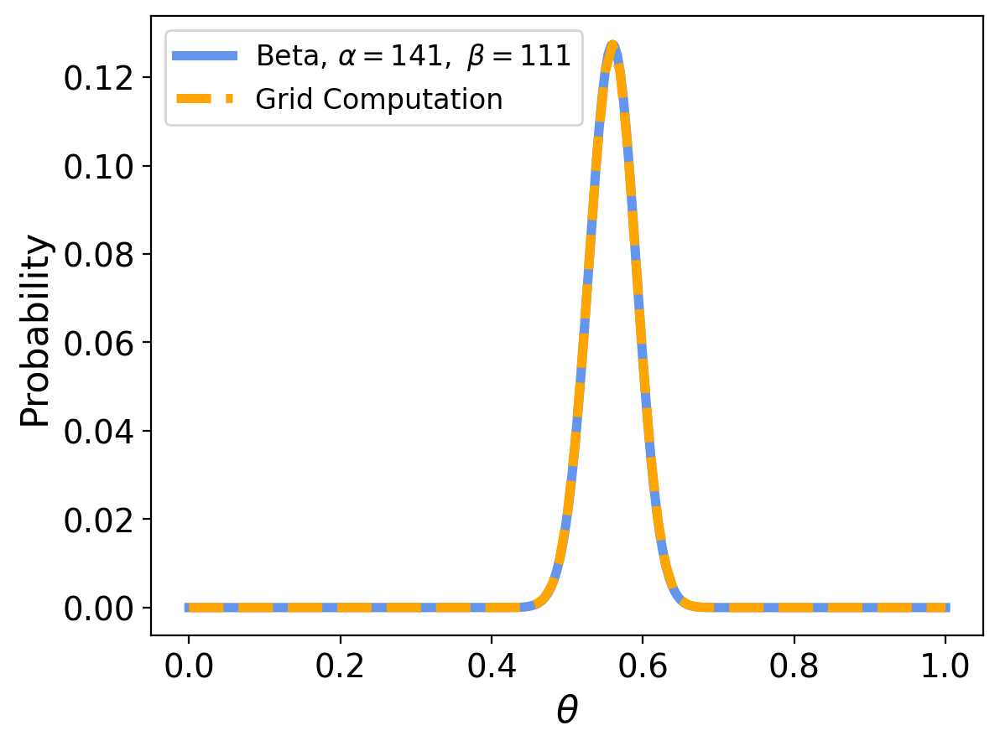

In [4]:
from scipy.stats import randint

def update(distribution, likelihood):
    '''Our standard Bayesian update function on a 1D grid'''
    distribution['probs'] = distribution['probs'] * likelihood
    prob_data = distribution['probs'].sum()
    distribution['probs'] = distribution['probs'] / prob_data
    return distribution

p_dist = pd.DataFrame(index = np.arange(101)/100)
p_dist['probs'] = randint(0, 101).pmf(np.arange(101)) 
prior = p_dist.copy()

from scipy.stats import binom

# compute whole-data likelihoods
likelihood = [binom.pmf(140, 250, p) for p in p_dist.index]

update(p_dist, likelihood);

fig, ax = plt.subplots()
ax.plot(xvals, posterior_dist/100, color = 'cornflowerblue', lw = 4)
p_dist.plot(ax = ax, color = 'orange', lw = 4, style = '--', fontsize = 14)
ax.legend([r'Beta, $\alpha=141,$ $\beta=111$', 'Grid Computation'], fontsize = 12, loc = 'best')
plt.xlabel(r'$\theta$', size = 16)
plt.ylabel('Probability', size = 16);

### Many Things are Now Easy

Note that since we have an analytic formula for the posterior, many things are simple.

For example, the MAP estimate of $\theta$ is just the mode of the Beta distribution.   This can be calculated analytically, and turns out to be:
    
$$ \operatorname{MAP}(\theta) = \arg\max_\theta\,\operatorname{Beta}_{\alpha, \beta}(\theta) = \frac{\alpha-1}{\alpha+\beta-2} $$

when $\alpha$ and $\beta$ are both larger than 1.

So for the Euro problem, $\operatorname{MAP}(\theta) = 140/250 = 0.56$

This shows that for the Binomial with a large enough dataset, the (Bayesian) MAP is the same as the (Frequentist) MLE.



Likewise, the MMSE estimate of $\theta$ is the mean of the Beta, which is $\frac{\alpha}{\alpha+\beta}$ (for any $\alpha, \beta$).

Notice that the difference between the MAP and the MMSE is only significant when $\alpha$ and $\beta$ are small -- ie, when one has relatively little data.

Further, we can easily calculate a credible interval for $\theta$:

In [5]:
# Calculate a 90% credible interval for this posterior:

low_bound = scipy.stats.beta(141, 111).ppf(0.05)
high_bound = scipy.stats.beta(141, 111).ppf(0.95)

print(fr'The 90% credible interval for theta is ({low_bound:0.3f}, {high_bound:0.3f})')

The 90% credible interval for theta is (0.508, 0.611)


## Return to World Cup

Ok, we'll do a couple more examples to show the power of conjugate priors.

Let's return to the [World Cup problem](21-Poisson-Processes.html#the-world-cup-problem).

You recall that we were interested in $\lambda$, the goal scoring rate of each team (France and Croatia).

We assumed that goal scoring for a given team occurred as a Poisson process, so the number of goals in a game was given by the Poisson distribution.

For a prior, we chose the __Gamma__ distribution, which is a distribution over $\lambda \geq 0$ with parameters $\alpha$ and $\beta$.

Here is the unnormalized Gamma distribution (leaving off the normalizing constant):
    
$$ \lambda^{\alpha-1}e^{-\lambda\beta} $$

And here is the (unnormalized) Poisson distribution:
    
$$ \lambda^k e^{-\lambda t} $$

So the unnormalized posterior is:

$$ \lambda^{\alpha+k-1}e^{-\lambda(\beta+t)} $$

The posterior has the functional form of the Gamma distribution, with new parameters $\alpha+k$ and $\beta+t$.

So now you see ... the Gamma is the __conjugate prior of the Poisson__ distribution.

This derivation provides insight into what the parameters of the posterior distribution mean: $\alpha$ reflects the number of events that have been observed, and $\beta$ reflects the elapsed time.

To perform a Bayesian update on the prior, we simply add the number of observed events to $\alpha$ and the duration of the observation to $\beta$.

In our previous analysis, we used the fact that the average number of goals per game is 1.4, so our prior was a Gamma distribution with $\alpha = 1.4$ and $\beta = 1$.

And 
* for France, who scored 4 goals, the posterior is a Gamma with $\alpha = 5.4$ and $\beta = 2$
* for Croatia, who scored 2 goals, the posterior is a Gamma with $\alpha = 3.4$ and $\beta = 2$.

In [6]:
from scipy.stats import gamma, poisson

def likelihood_poisson(lam, data):
    '''Returns the likelihood of seeing a k goals for goal scoring rate lambda'''
    return [poisson.pmf(data, l)  for l in lam]
    
def update(distribution, likelihood):
    '''our standard Bayesian update function'''
    distribution['probs'] = distribution['probs'] * likelihood
    prob_data = distribution['probs'].sum()
    distribution['probs'] = distribution['probs'] / prob_data
    return distribution

x_vals = np.arange(0, 10, 0.1)
gamma_vals = [gamma.pdf(lam, 1.4) for lam in x_vals]
prior = pd.DataFrame({'lams':np.arange(0, 10, .1),'probs':gamma_vals/sum(gamma_vals)})
france = prior.copy()
update(france, likelihood_poisson(france['lams'], 4));

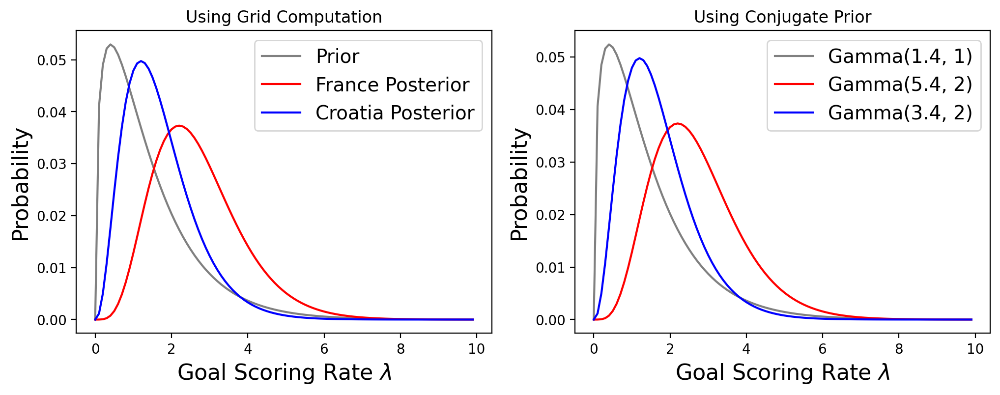

In [7]:
croatia = prior.copy()
update(croatia, likelihood_poisson(croatia['lams'], 2));

fig, ax = plt.subplots(1, 2, figsize = (12,4))

ax[0].plot(prior['lams'], prior['probs'], color="gray")
ax[0].plot(france['lams'], france['probs'], color="red")
ax[0].plot(france['lams'], croatia['probs'], color="blue")
ax[0].legend(['Prior', 'France Posterior', 'Croatia Posterior'], fontsize = 14, loc = 'best')
ax[0].set_xlabel('Goal Scoring Rate $\lambda$', size = 16)
ax[0].set_ylabel('Probability', size = 16)
ax[0].set_title('Using Grid Computation')

g_prior = gamma.pdf(x_vals, a = 1.4, scale = 1)
g_france = gamma.pdf(x_vals, a = 5.4, scale = 1/2)
g_croatia = gamma.pdf(x_vals, a = 3.4, scale = 1/2)

ax[1].plot(x_vals, g_prior/10, color="gray")
ax[1].plot(x_vals, g_france/10, color="red")
ax[1].plot(x_vals, g_croatia/10, color="blue")
ax[1].legend(['Gamma(1.4, 1)', 'Gamma(5.4, 2)', 'Gamma(3.4, 2)'], fontsize = 14, loc = 'best')
ax[1].set_xlabel('Goal Scoring Rate $\lambda$', size = 16)
ax[1].set_ylabel('Probability', size = 16)
ax[1].set_title('Using Conjugate Prior');

Now, let's see how quickly we can compute the probability that France would win a rematch by using conjugate priors.

Recall that for this, we compare samples from the __posterior predictive distribution__ -- that is the distribution of what we can actually observe (goals).

Rather than doing this via a grid search, we will use a method that is much easier to implement (and understand).

We will take advantage of the fact that we have a `scipy` function that can sample Gamma and Poisson distributions.

We will simply __sample__ each posterior predictive distribution, and compare samples.   We will then count up how many times the sample from France's distribution exceeds the sample from Croatia's distribution.

In other words, our strategy will be:
1. For some number of simulated "matches":
    1. For each team:
        1. Use the team's Gamma to sample its posterior on $\lambda$
        2. Use the Poisson with the $\lambda$ obtained in (a.) to sample the number of goals scored
    3. Compare the samples to determine the winner of this "match"
2. Compute the fraction of matches won by France

Notice how clear this logic is -- very easy to follow.

In [8]:
n_trials = 10000
n_france_wins = 0

for i in range(n_trials):
    france_lambda = gamma.rvs(a = 5.4, scale = 1/2)
    france_goals = poisson.rvs(france_lambda)
    croatia_lambda = gamma.rvs(a = 3.4, scale = 1/2)
    croatia_goals = poisson.rvs(croatia_lambda)
    if france_goals > croatia_goals: n_france_wins += 1
        
estimated_p = n_france_wins/n_trials
std_err = np.sqrt(estimated_p * (1-estimated_p) / n_trials)

print(rf'The probability France would win a rematch is {n_france_wins/n_trials:0.4f} +/- {(1.96 * std_err):0.4f}')

The probability France would win a rematch is 0.5674 +/- 0.0097


As we would expected, what we got when we [computed the exact solution](21-Poisson-Processes.html#back-to-predicting-a-rematch) lies within our confidence interval here.

The strategy we used here is called a __Monte Carlo__ evalation.  It is attractive because it is so easy to program, and so clear what is going on.

In a Monte Carlo evaluation, we are concerned with quantities that are functions of distributions.   Instead of trying to compute the expected value of the quantity exactly, we sample the distribution, compute the quantity for that sample, and average.

## Lions and Tigers and Bears

As a final example, we'll explore the Multinomial and its conjugate prior the __Dirichlet__ distribution.

To understand this case, think of the multinomial as the extension of the binomial to more than two outcomes.   So the multinomial can describe the probabilities of rolling "weighted" dice, such that different sides land with different probabilities.

Then the Dirichlet's relationship to the multinomial is just like the Beta's relationship to the Binomial.

Here's an example to make things concrete.

Suppose we visit a wild animal preserve where we know that the only animals are lions and tigers and bears, but we don’t know how many of each there are. During the tour, we see 3 lions, 2 tigers, and one bear. Assuming that every animal had an equal chance to appear in our sample, what is the probability that the next animal we see is a bear?

To answer this question, we’ll use the data to estimate the prevalence of each species, that is, what fraction of the animals belong to each species. If we know the prevalences, we can use the multinomial distribution to compute the probability of the data. For example, suppose we know that the fraction of lions, tigers, and bears is 0.4, 0.3, and 0.3, respectively.

In that case the probability of the data is:

In [9]:
from scipy.stats import multinomial

data = 3, 2, 1
n = np.sum(data)
ps = 0.4, 0.3, 0.3

multinomial.pmf(data, n, ps)

0.10368

### The Dirichlet

The conjugate prior for the multinomial distribution is the Dirichlet distribution.

In a Dirichlet distribution, the quantities are vectors of probabilities, $\mathbf{x}$, and the parameter of the distribution is a vector $\alpha$.

For example:

In [10]:
from scipy.stats import dirichlet

alpha = 1, 2, 3
dist = dirichlet(alpha)

Since we provided three parameters, the result is a distribution of three variables. If we draw a random value from this distribution, we get a __probability vector__ -- that is, a vector that sums to 1.

In [11]:
print(dist.rvs())
print(dist.rvs().sum())

[[0.38359135 0.27683229 0.33957636]]
1.0


You can think of the probability vector as giving the parameters of a multinomial.

OK, let's construct the posterior corresponding to 3 lions, 2 tigers, and 1 bear:

In [12]:
dist = dirichlet((4, 3, 2))

Here is a density plot of the posterior.  Note that there are three parameters, so the density is in 3D.

However, only points that sum to 1 are allowed as distributions.   Those points lie on a triangle in 3D space.

In [13]:
from matplotlib import animation
import matplotlib as mp
mp.rcParams['animation.html'] = 'jshtml'

fig = plt.figure(figsize=(6,4))
ax = fig.add_subplot(111, projection='3d')
axlim = [-0.05, 1.05]
plt.close()
ax.axes.set_xlim(axlim)
ax.axes.set_ylim(axlim)
ax.axes.set_zlim(axlim)
ax.axes.set_xlabel(r'P(Lions)', size = 15)
ax.axes.set_ylabel(r'P(Tigers)', size = 15)
ax.axes.set_zlabel(r'P(Bears)', size = 15)

scale = 50

# generate the probability simplex
pts = [(x/scale, y/scale, 1-(x+y)/scale) for x in range(scale+1) for y in range(scale+1-x)]
x, y, z = zip(*pts)
density = [dist.pdf(pt) for pt in pts]

ax.scatter(x, y, z, c = density, marker = '.', cmap = 'Blues')
                    
ax.plot([1, 0, 0, 1], [0, 1, 0, 0], zs = [0, 0, 1, 0])

ax.view_init(azim = 0, elev = 22)

#
def anim(frame):
    ax.view_init(azim = frame, elev = 22)
    # fig.canvas.draw()
#
# create and display the animation 
HTML(animation.FuncAnimation(fig, anim,
                       frames = 4 * np.arange(90),
                       fargs = None,
                       interval = 30,
                       repeat = False).to_jshtml(default_mode = 'loop'))

If we had seen more data, then the posterior would become more concentrated around its mode.  This would reflect greater certainty about the multinomial distribution's parameters.

For example, suppose we had seen 30 lions, 20 tigers, and 10 bears.  Then the distribution would be:

In [14]:
dist = dirichlet((31, 21, 11))

In [15]:
fig = plt.figure(figsize=(6,4))
ax = fig.add_subplot(111, projection='3d')
axlim = [-0.05, 1.05]
plt.close()
ax.axes.set_xlim(axlim)
ax.axes.set_ylim(axlim)
ax.axes.set_zlim(axlim)
ax.axes.set_xlabel(r'P(Lions)', size = 15)
ax.axes.set_ylabel(r'P(Tigers)', size = 15)
ax.axes.set_zlabel(r'P(Bears)', size = 15)

scale = 50

# generate the probability simplex
pts = [(x/scale, y/scale, 1-(x+y)/scale) for x in range(scale+1) for y in range(scale+1-x)]
x, y, z = zip(*pts)
density = [dist.pdf(pt) for pt in pts]

ax.scatter(x, y, z, c = density, marker = '.', cmap = 'Blues')
                    
ax.plot([1, 0, 0, 1], [0, 1, 0, 0], zs = [0, 0, 1, 0])

ax.view_init(azim = 0, elev = 22)

#
def anim(frame):
    ax.view_init(azim = frame, elev = 22)
    # fig.canvas.draw()
#
# create and display the animation 
HTML(animation.FuncAnimation(fig, anim,
                       frames = 4 * np.arange(90),
                       fargs = None,
                       interval = 30,
                       repeat = False).to_jshtml(default_mode = 'loop'))

If we are interested in the individual parameters of the multinomial, we can marginalize the posterior (sum over all but one parameter).

It turns out that each marginal is just a Beta distribution, so we can immediately construct it from the data.

Let's go back to our original set of observations of 3 lions, 2 tigers, and 1 bear.

Then the marginal for lions would be a Beta with $\alpha = 4$ and $\beta = 4$, because we've seen 3 lions and 3 non-lions.   Similarly for the others:

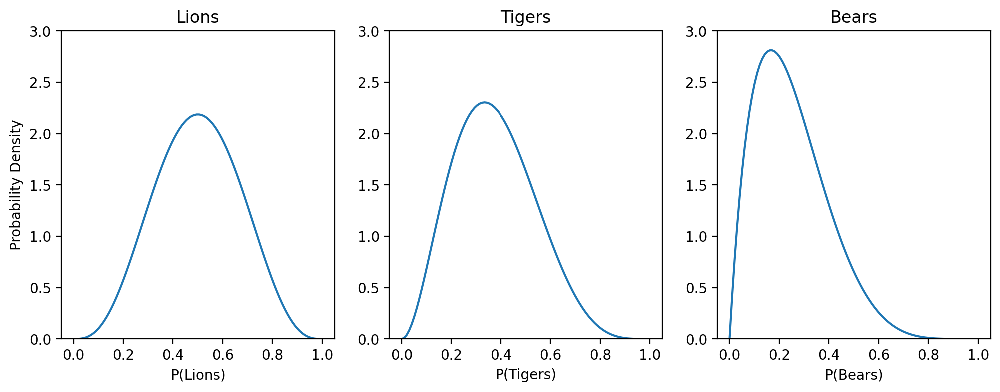

In [16]:
data = (3, 2, 1)
labels = ('Lions', 'Tigers', 'Bears')
data_sum = np.sum(data)
xvals = np.linspace(0, 1, 100)

fig, ax = plt.subplots(1, 3, figsize = (12, 4))

for i in range(3):
    ax[i].plot(xvals, scipy.stats.beta(a = data[i]+1, b = data_sum-data[i]+1).pdf(xvals))
    ax[i].set_title(labels[i])
    ax[i].set_xlabel(f'P({labels[i]})')
    ax[i].set_ylim([0, 3])

ax[0].set_ylabel('Probability Density');

## Summary

At this point, if you feel like you’ve been tricked, that's understandable. It turns out that many of the problems we've studied so far can be solved with just a few arithmetic operations. So why did we go to all the trouble of using grid algorithms?


Sadly, there are only a few problems we can solve with conjugate priors; in fact, this lecture includes most of the ones that are useful in practice.

For the vast majority of problems, there is no conjugate prior and no shortcut to compute the posterior distribution. That’s why we need grid algorithms as our general strategy.

But when you have a problem that can use a conjugate prior -- for example, a likelihood that comes from Binomial, or Poisson, or Multinomial -- then a conjugate prior can save you a lot of work!